<div class="alert alert-block alert-info">

# Imports

</div>

In [1]:
import numpy as np
import pandas as pd

#pd.set_option('display.expand_frame_repr', True)
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 5000)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import matthews_corrcoef

In [2]:
import talos as ta

Using TensorFlow backend.


<div class="alert alert-block alert-info">

# Dataframes

</div>

In [3]:
df_features = pd.read_csv('./dataset/ted_main_features_4122.csv',sep="|",quotechar='"')

In [4]:
df_features.shape

(2550, 4122)

In [5]:
df_features.head()

comments  duration  languages  num_speaker   views  film_month  \
0        10       810          1            1  418368           8   
1         3       795          1            1  542088           8   
2         8       723          4            1  707788           8   
3        10       934          2            1  527314           8   
4        33       722          4            1  613915           7   

   film_dayofweek  published_month  published_dayofweek  event_TED  \
0               5                9                    1          1   
1               5                9                    4          1   
2               5                9                    4          1   
3               5                9                    2          1   
4               2                9                    3          1   

   event_TEDx  event_noTED  previous_talks  previous_talk_views  \
0           0            0               0                    0   
1           0            0               0                    0   
2           0            0               0                    0   
3           0            0               0                    0   
4           0            0               0                    0   

   previous_views_sum  previous_views_max  previous_views_min  rating_funny  \
0                   0                   0                   0             0   
1                   0                   0                   0             6   
2                   0                   0                   0            19   
3                   0                   0                   0             2   
4                   0                   0                   0             4   

   rating_beautiful  rating_ingenious  rating_courageous  rating_longwinded  \
0                 9                 4                  8                  1   
1                41                 7                 43                  3   
2                54                12                 77                  6   
3                 7                19                  6                  1   
4                15                 3                  2                 11   

   rating_confusing  rating_informative  rating_fascinating  \
0                 0                  37                  15   
1                 1                  15                  14   
2                 1                  71                  34   
3                 0                  78                  28   
4                 4                 157                  35   

   rating_unconvincing  rating_persuasive  rating_jaw-dropping  rating_ok  \
0                    1                 30                    0          6   
1                    5                  2                    3          1   
2                    2                 63                   16          3   
3                    3                 36                    3          0   
4                   38                 62                    7          9   

   rating_obnoxious  rating_inspiring  tag_technology  tag_science  \
0                 1                31               0            0   
1                 5                35               0            0   
2                 1                72               0            0   
3                 0                73               0            0   
4                18                18               0            0   

   tag_design  tag_business  tag_collaboration  tag_innovation  \
0           0             0                  0               0   
1           0             0                  0               0   
2           0             0                  0               0   
3           0             0                  0               1   
4           0             1                  1               0   

   tag_social_change  tag_health  tag_nature  tag_environment  tag_future  \
0                  0           0           0                0           0   


In [6]:
df_features.describe()

comments     duration    languages  num_speaker         views  \
count  2550.000000  2550.000000  2550.000000  2550.000000  2.550000e+03   
mean    191.562353   826.510196    27.326275     1.028235  1.698297e+06   
std     282.315223   374.009138     9.563452     0.207705  2.498479e+06   
min       2.000000   135.000000     0.000000     1.000000  5.044300e+04   
25%      63.000000   577.000000    23.000000     1.000000  7.557928e+05   
50%     118.000000   848.000000    28.000000     1.000000  1.124524e+06   
75%     221.750000  1046.750000    33.000000     1.000000  1.700760e+06   
max    6404.000000  5256.000000    72.000000     5.000000  4.722711e+07   

        film_month  film_dayofweek  published_month  published_dayofweek  \
count  2550.000000     2550.000000      2550.000000          2550.000000   
mean      5.634510        2.562353         6.297255             2.181569   
std       3.400861        1.844652         3.367435             1.651578   
min       1.000000        0.000000         1.000000             0.000000   
25%       2.000000        1.000000         3.000000             1.000000   
50%       5.000000        2.000000         6.000000             2.000000   
75%       9.000000        4.000000         9.000000             3.000000   
max      12.000000        6.000000        12.000000             6.000000   

         event_TED   event_TEDx  event_noTED  previous_talks  \
count  2550.000000  2550.000000  2550.000000     2550.000000   
mean      0.771765     0.184706     0.043529        0.228627   
std       0.419777     0.388135     0.204086        0.659217   
min       0.000000     0.000000     0.000000        0.000000   
25%       1.000000     0.000000     0.000000        0.000000   
50%       1.000000     0.000000     0.000000        0.000000   
75%       1.000000     0.000000     0.000000        0.000000   
max       1.000000     1.000000     1.000000        8.000000   

       previous_talk_views  previous_views_sum  previous_views_max  \
count         2.550000e+03        2.550000e+03        2.550000e+03   
mean          3.587353e+05        5.742821e+05        4.687067e+05   
std           1.776105e+06        2.779656e+06        2.357099e+06   
min           0.000000e+00        0.000000e+00        0.000000e+00   
25%           0.000000e+00        0.000000e+00        0.000000e+00   
50%           0.000000e+00        0.000000e+00        0.000000e+00   
75%           0.000000e+00        0.000000e+00        0.000000e+00   
max           4.722711e+07        5.634842e+07        4.722711e+07   

       previous_views_min  rating_funny  rating_beautiful  rating_ingenious  \
count        2.550000e+03   2550.000000       2550.000000       2550.000000   
mean         3.215112e+05    154.468627        192.293725        150.739608   
std          1.717160e+06    589.137728        477.375664        283.800437   
min          0.000000e+00      0.000000          0.000000          0.000000   
25%          0.000000e+00      8.000000         26.000000         26.000000   
50%          0.000000e+00     21.000000         68.000000         69.000000   
75%          0.000000e+00     92.000000        190.750000        170.750000   
max          4.722711e+07  19645.000000       9437.000000       6073.000000   

       rating_courageous  rating_longwinded  rating_confusing  \
count        2550.000000        2550.000000       2550.000000   
mean          164.723529          32.683922         20.955294   
std           433.805453          41.608618         31.552561   
min             0.000000           0.000000          0.000000   
25%            20.000000           9.000000          5.000000   
50%            51.000000          19.000000         12.000000   
75%           149.000000          41.000000         24.000000   
max          8668.000000         447.000000        531.000000   

       rating_informative  rating_fascinating  rating_unconvincing  \
count         2550.000000         2550.000000          2550.000000   
mea

<div class="alert alert-block alert-info">

# Dummies

</div>

## Create Dummies

In [7]:
df_film_month = pd.get_dummies(df_features['film_month'],prefix='film_month')
df_published_month = pd.get_dummies(df_features['published_month'],prefix='published_month')

df_film_dow = pd.get_dummies(df_features['film_dayofweek'],prefix='film_dow')
df_published_dow = pd.get_dummies(df_features['published_dayofweek'],prefix='published_dow')

In [8]:
df_film_month.head(2)

,film_month_1,film_month_2,film_month_3,film_month_4,film_month_5,film_month_6,film_month_7,film_month_8,film_month_9,film_month_10,film_month_11,film_month_12
0,0,0,0,0,0,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,0,0


In [9]:
df_film_month.shape

(2550, 12)

In [10]:
df_published_month.head(2)

,published_month_1,published_month_2,published_month_3,published_month_4,published_month_5,published_month_6,published_month_7,published_month_8,published_month_9,published_month_10,published_month_11,published_month_12
0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0,0,0,0,0,0,0,1,0,0,0


In [11]:
df_published_month.shape

(2550, 12)

In [12]:
df_film_dow.head(2)

,film_dow_0,film_dow_1,film_dow_2,film_dow_3,film_dow_4,film_dow_5,film_dow_6
0,0,0,0,0,0,1,0
1,0,0,0,0,0,1,0


In [13]:
df_film_dow.shape

(2550, 7)

In [14]:
df_published_dow.head(2)

,published_dow_0,published_dow_1,published_dow_2,published_dow_3,published_dow_4,published_dow_5,published_dow_6
0,0,1,0,0,0,0,0
1,0,0,0,0,1,0,0


In [15]:
df_published_dow.shape

(2550, 7)

## Drop Columns

In [16]:
df_features.drop(columns=['film_month','published_month','film_dayofweek','published_dayofweek'], inplace=True)

## Join Dummies

In [17]:
df_features = df_features.merge(df_film_month, left_index=True, right_index=True)
df_features = df_features.merge(df_published_month, left_index=True, right_index=True)
df_features = df_features.merge(df_film_dow, left_index=True, right_index=True)
df_features = df_features.merge(df_published_dow, left_index=True, right_index=True)

In [18]:
df_features.describe()

comments     duration    languages  num_speaker         views  \
count  2550.000000  2550.000000  2550.000000  2550.000000  2.550000e+03   
mean    191.562353   826.510196    27.326275     1.028235  1.698297e+06   
std     282.315223   374.009138     9.563452     0.207705  2.498479e+06   
min       2.000000   135.000000     0.000000     1.000000  5.044300e+04   
25%      63.000000   577.000000    23.000000     1.000000  7.557928e+05   
50%     118.000000   848.000000    28.000000     1.000000  1.124524e+06   
75%     221.750000  1046.750000    33.000000     1.000000  1.700760e+06   
max    6404.000000  5256.000000    72.000000     5.000000  4.722711e+07   

         event_TED   event_TEDx  event_noTED  previous_talks  \
count  2550.000000  2550.000000  2550.000000     2550.000000   
mean      0.771765     0.184706     0.043529        0.228627   
std       0.419777     0.388135     0.204086        0.659217   
min       0.000000     0.000000     0.000000        0.000000   
25%       1.000000     0.000000     0.000000        0.000000   
50%       1.000000     0.000000     0.000000        0.000000   
75%       1.000000     0.000000     0.000000        0.000000   
max       1.000000     1.000000     1.000000        8.000000   

       previous_talk_views  previous_views_sum  previous_views_max  \
count         2.550000e+03        2.550000e+03        2.550000e+03   
mean          3.587353e+05        5.742821e+05        4.687067e+05   
std           1.776105e+06        2.779656e+06        2.357099e+06   
min           0.000000e+00        0.000000e+00        0.000000e+00   
25%           0.000000e+00        0.000000e+00        0.000000e+00   
50%           0.000000e+00        0.000000e+00        0.000000e+00   
75%           0.000000e+00        0.000000e+00        0.000000e+00   
max           4.722711e+07        5.634842e+07        4.722711e+07   

       previous_views_min  rating_funny  rating_beautiful  rating_ingenious  \
count        2.550000e+03   2550.000000       2550.000000       2550.000000   
mean         3.215112e+05    154.468627        192.293725        150.739608   
std          1.717160e+06    589.137728        477.375664        283.800437   
min          0.000000e+00      0.000000          0.000000          0.000000   
25%          0.000000e+00      8.000000         26.000000         26.000000   
50%          0.000000e+00     21.000000         68.000000         69.000000   
75%          0.000000e+00     92.000000        190.750000        170.750000   
max          4.722711e+07  19645.000000       9437.000000       6073.000000   

       rating_courageous  rating_longwinded  rating_confusing  \
count        2550.000000        2550.000000       2550.000000   
mean          164.723529          32.683922         20.955294   
std           433.805453          41.608618         31.552561   
min             0.000000           0.000000          0.000000   
25%            20.000000           9.000000          5.000000   
50%            51.000000          19.000000         12.000000   
75%           149.000000          41.000000         24.000000   
max          8668.000000         447.000000        531.000000   

       rating_informative  rating_fascinating  rating_unconvincing  \
count         2550.000000         2550.000000          2550.000000   
mean           348.013333          314.164314            52.767843   
std            540.225980          624.535809            91.678632   
min              0.000000            0.000000             0.000000   
25%             99.250000           79.000000            12.000000   
50%            212.000000          162.000000            27.000000   
75%            401.000000          344.000000            60.000000   
max           9787.000000        14447.000000          2194.000000   

       rating_persuasive  rating_jaw-dropping    rating_ok  rating_obnoxious  \
count        2550.000000          2550.000000  2550.000000       2550.000000   
mean          220.086275           14

<div class="alert alert-block alert-info">

# Train, Test, Split

</div>

In [19]:
tag_cols = [ col for col in df_features.columns if col.startswith("tag_") and col != "tag_other" ]
print(tag_cols)

['tag_technology', 'tag_science', 'tag_design', 'tag_business', 'tag_collaboration', 'tag_innovation', 'tag_social_change', 'tag_health', 'tag_nature', 'tag_environment', 'tag_future', 'tag_communication', 'tag_activism', 'tag_children', 'tag_personal_growth', 'tag_humanity', 'tag_society', 'tag_identity', 'tag_community', 'tag_culture', 'tag_global_issues', 'tag_entertainment', 'tag_art', 'tag_politics', 'tag_economics', 'tag_religion']


In [20]:
X = df_features.drop(columns=tag_cols)
y = df_features[tag_cols]

In [21]:
X.head()

comments  duration  languages  num_speaker   views  event_TED  event_TEDx  \
0        10       810          1            1  418368          1           0   
1         3       795          1            1  542088          1           0   
2         8       723          4            1  707788          1           0   
3        10       934          2            1  527314          1           0   
4        33       722          4            1  613915          1           0   

   event_noTED  previous_talks  previous_talk_views  previous_views_sum  \
0            0               0                    0                   0   
1            0               0                    0                   0   
2            0               0                    0                   0   
3            0               0                    0                   0   
4            0               0                    0                   0   

   previous_views_max  previous_views_min  rating_funny  rating_beautiful  \
0                   0                   0             0                 9   
1                   0                   0             6                41   
2                   0                   0            19                54   
3                   0                   0             2                 7   
4                   0                   0             4                15   

   rating_ingenious  rating_courageous  rating_longwinded  rating_confusing  \
0                 4                  8                  1                 0   
1                 7                 43                  3                 1   
2                12                 77                  6                 1   
3                19                  6                  1                 0   
4                 3                  2                 11                 4   

   rating_informative  rating_fascinating  rating_unconvincing  \
0                  37                  15                    1   
1                  15                  14                    5   
2                  71                  34                    2   
3                  78                  28                    3   
4                 157                  35                   38   

   rating_persuasive  rating_jaw-dropping  rating_ok  rating_obnoxious  \
0                 30                    0          6                 1   
1                  2                    3          1                 5   
2                 63                   16          3                 1   
3                 36                    3          0                 0   
4                 62                    7          9                18   

   rating_inspiring  tag_other  word_000  word_10  word_100  word_12  \
0                31          9         0        0         0        0   
1                35          5         0        0         0        0   
2                72          5         0        0         0        0   
3                73          4         0        0         0        0   
4                18          6         0        0         0        0   

   word_17th  word_1960  word_1970  word_1980  word_19th  word_20  word_20th  \
0          0          0          0          0          0        0          0   
1          0          0          0          0          0        0          0   
2          0          0          0          0          0        0          0   
3          0          0          0          0          0        0          0   
4          0          0          0          0          0        0          0   

   word_21st  word_30  word_3d  word_50  word_aaron  word_abandon  \
0          0        0        0        0           0             0   
1          0        0        0        0           0             0   
2          0        0        0        0           0             0   
3          0        0        0        0           0             0   
4          0        0        0  

In [22]:
X.shape

(2550, 4130)

In [23]:
y.head()

,tag_technology,tag_science,tag_design,tag_business,tag_collaboration,tag_innovation,tag_social_change,tag_health,tag_nature,tag_environment,tag_future,tag_communication,tag_activism,tag_children,tag_personal_growth,tag_humanity,tag_society,tag_identity,tag_community,tag_culture,tag_global_issues,tag_entertainment,tag_art,tag_politics,tag_economics,tag_religion
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [24]:
y.shape

(2550, 26)

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101, shuffle=True)

In [26]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(2040, 4130)
(510, 4130)
(2040, 26)
(510, 26)


In [27]:
X_train.head()

comments  duration  languages  num_speaker    views  event_TED  \
1673       356       769         26            1   462012          0   
2478       501      1308         31            1  2676717          1   
1722       287       554         34            1  4646183          1   
1572       231       616         35            1  1866264          1   
531         51      1012         21            1  1024661          1   

      event_TEDx  event_noTED  previous_talks  previous_talk_views  \
1673           1            0               0                    0   
2478           0            0               1              1596067   
1722           0            0               0                    0   
1572           0            0               2              4329332   
531            0            0               0                    0   

      previous_views_sum  previous_views_max  previous_views_min  \
1673                   0                   0                   0   
2478             1596067             1596067             1596067   
1722                   0                   0                   0   
1572             6963691             4329332             2634359   
531                    0                   0                   0   

      rating_funny  rating_beautiful  rating_ingenious  rating_courageous  \
1673            77                42                33                 73   
2478           219                67               189                 27   
1722          4013               201               229                353   
1572             9                15                28                125   
531             11               194               108                117   

      rating_longwinded  rating_confusing  rating_informative  \
1673                 88                46                 244   
2478                197               101                 680   
1722                 36                13                 202   
1572                 53                61                 690   
531                  13                 4                 198   

      rating_fascinating  rating_unconvincing  rating_persuasive  \
1673                  46                  163                246   
2478                 653                  264                182   
1722                 262                   28                185   
1572                  64                  108                385   
531                  112                    2                 64   

      rating_jaw-dropping  rating_ok  rating_obnoxious  rating_inspiring  \
1673                   22        114                87               340   
2478                   89        289                45               204   
1722                  148        200                42               451   
1572                   69        207                31               124   
531                    17         24                 0               563   

      tag_other  word_000  word_10  word_100  word_12  word_17th  word_1960  \
1673          7         0        0         0        0          0          0   
2478          6         0        0         0        0          0          0   
1722          4         0        0         0        0          0          0   
1572          4         0        0         0        0          0          0   
531           3         0        0         0        0          0          0   

      word_1970  word_1980  word_19th  word_20  word_20th  word_21st  word_30  \
1673          0          0          0        0          0          0        0   
2478          0          0          0        0          0          0        0   
1722          0          0          0        0          0          0        0   
1572          0          0          0        0          0          0        0   
531           0          0          0        0          0          0        0   

      word_3d  word_50  word_aaron  word_abandon  word_abilit

In [28]:
X_test.head()

comments  duration  languages  num_speaker    views  event_TED  \
1018       127       491         35            1  1089949          1   
2414        57      1083         26            1   745231          1   
2120       133       919         24            1   792495          1   
2199        66       953         29            1  2161846          1   
2145       152      1602         29            1  1625469          0   

      event_TEDx  event_noTED  previous_talks  previous_talk_views  \
1018           0            0               0                    0   
2414           0            0               0                    0   
2120           0            0               0                    0   
2199           0            0               0                    0   
2145           0            1               0                    0   

      previous_views_sum  previous_views_max  previous_views_min  \
1018                   0                   0                   0   
2414                   0                   0                   0   
2120                   0                   0                   0   
2199                   0                   0                   0   
2145                   0                   0                   0   

      rating_funny  rating_beautiful  rating_ingenious  rating_courageous  \
1018            44                15               116                 22   
2414            80                44                 7                274   
2120             5                37                31                 57   
2199            89               401               536                 22   
2145            52                73                83                 38   

      rating_longwinded  rating_confusing  rating_informative  \
1018                  3                 3                 325   
2414                 10                 1                  44   
2120                 34                16                 354   
2199                  7                 6                 411   
2145                 42                14                 375   

      rating_fascinating  rating_unconvincing  rating_persuasive  \
1018                  91                   11                328   
2414                 124                   18                 22   
2120                  85                   29                174   
2199                 747                    3                 55   
2145                 376                   21                261   

      rating_jaw-dropping  rating_ok  rating_obnoxious  rating_inspiring  \
1018                   18         33                 6               284   
2414                   74         20                 7               288   
2120                   28         68                16               259   
2199                  362         48                 1               329   
2145                   63         92                 7               374   

      tag_other  word_000  word_10  word_100  word_12  word_17th  word_1960  \
1018          3         0        0         0        0          0          0   
2414          7         0        0         0        0          0          0   
2120          6         0        0         0        0          0          0   
2199          4         0        0         0        0          0          0   
2145          6         0        0         0        0          0          0   

      word_1970  word_1980  word_19th  word_20  word_20th  word_21st  word_30  \
1018          0          0          0        0          0          0        0   
2414          0          0          0        0          0          0        0   
2120          0          0          0        0          0          0        0   
2199          0          0          0        0          0          0        0   
2145          0          0          0        0          0          0        0   

      word_3d  word_50  word_aaron  word_abandon  word_abilit

<div class="alert alert-block alert-info">

# Estandarizar

</div>

In [29]:
scaler = StandardScaler()
scaler = MinMaxScaler()

# Scale: Fit
print(scaler.fit(X_train))

# Scale: Train Transform
X_train = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)

MinMaxScaler(copy=True, feature_range=(0, 1))


In [30]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [31]:
X_train.head()

comments  duration  languages  num_speaker     views  event_TED  \
0  0.055295  0.123804   0.361111          0.0  0.008724        0.0   
1  0.077944  0.229057   0.430556          0.0  0.055669        1.0   
2  0.044517  0.081820   0.472222          0.0  0.097416        1.0   
3  0.035770  0.093927   0.486111          0.0  0.038490        1.0   
4  0.007654  0.171256   0.291667          0.0  0.020650        1.0   

   event_TEDx  event_noTED  previous_talks  previous_talk_views  \
0         1.0          0.0        0.000000             0.000000   
1         0.0          0.0        0.142857             0.033796   
2         0.0          0.0        0.000000             0.000000   
3         0.0          0.0        0.285714             0.091670   
4         0.0          0.0        0.000000             0.000000   

   previous_views_sum  previous_views_max  previous_views_min  rating_funny  \
0            0.000000            0.000000            0.000000      0.003920   
1            0.028325            0.033796            0.033796      0.011148   
2            0.000000            0.000000            0.000000      0.204276   
3            0.123583            0.091670            0.055781      0.000458   
4            0.000000            0.000000            0.000000      0.000560   

   rating_beautiful  rating_ingenious  rating_courageous  rating_longwinded  \
0          0.004451          0.005434           0.008816           0.221106   
1          0.007100          0.031121           0.003261           0.494975   
2          0.021299          0.037708           0.042633           0.090452   
3          0.001589          0.004611           0.015097           0.133166   
4          0.020557          0.017784           0.014130           0.032663   

   rating_confusing  rating_informative  rating_fascinating  \
0          0.086629            0.024931            0.003184   
1          0.190207            0.069480            0.045200   
2          0.024482            0.020640            0.018135   
3          0.114878            0.070502            0.004430   
4          0.007533            0.020231            0.007752   

   rating_unconvincing  rating_persuasive  rating_jaw-dropping  rating_ok  \
0             0.074294           0.022982             0.001494   0.085011   
1             0.120328           0.017003             0.006043   0.215511   
2             0.012762           0.017283             0.010049   0.149142   
3             0.049225           0.035968             0.004685   0.154362   
4             0.000912           0.005979             0.001154   0.017897   

   rating_obnoxious  rating_inspiring  tag_other  word_000  word_10  word_100  \
0          0.084384          0.013444   0.318182       0.0      0.0       0.0   
1          0.043647          0.007986   0.272727       0.0      0.0       0.0   
2          0.040737          0.017898   0.181818       0.0      0.0       0.0   
3          0.030068          0.004775   0.181818       0.0      0.0       0.0   
4          0.000000          0.022393   0.136364       0.0      0.0       0.0   

   word_12  word_17th  word_1960  word_1970  word_1980  word_19th  word_20  \
0      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
1      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
2      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
3      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
4      0.0        0.0        0.0        0.0        0.0        0.0      0.0   

   word_20th  word_21st  word_30  word_3d  word_50  word_aaron  word_abandon  \
0        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
1        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
2        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
3        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
4        0.0        0.0      0.

In [32]:
X_test.head()

comments  duration  languages  num_speaker     views  event_TED  \
0  0.019525  0.069518   0.486111          0.0  0.022034        1.0   
1  0.008591  0.185120   0.361111          0.0  0.014727        1.0   
2  0.020462  0.153095   0.333333          0.0  0.015729        1.0   
3  0.009997  0.159734   0.402778          0.0  0.044755        1.0   
4  0.023430  0.286467   0.402778          0.0  0.033386        0.0   

   event_TEDx  event_noTED  previous_talks  previous_talk_views  \
0         0.0          0.0             0.0                  0.0   
1         0.0          0.0             0.0                  0.0   
2         0.0          0.0             0.0                  0.0   
3         0.0          0.0             0.0                  0.0   
4         0.0          1.0             0.0                  0.0   

   previous_views_sum  previous_views_max  previous_views_min  rating_funny  \
0                 0.0                 0.0                 0.0      0.002240   
1                 0.0                 0.0                 0.0      0.004072   
2                 0.0                 0.0                 0.0      0.000255   
3                 0.0                 0.0                 0.0      0.004530   
4                 0.0                 0.0                 0.0      0.002647   

   rating_beautiful  rating_ingenious  rating_courageous  rating_longwinded  \
0          0.001589          0.019101           0.002657           0.007538   
1          0.004662          0.001153           0.033092           0.025126   
2          0.003921          0.005105           0.006884           0.085427   
3          0.042492          0.088260           0.002657           0.017588   
4          0.007736          0.013667           0.004589           0.105528   

   rating_confusing  rating_informative  rating_fascinating  \
0          0.005650            0.033207            0.006299   
1          0.001883            0.004496            0.008583   
2          0.030132            0.036170            0.005884   
3          0.011299            0.041994            0.051706   
4          0.026365            0.038316            0.026026   

   rating_unconvincing  rating_persuasive  rating_jaw-dropping  rating_ok  \
0             0.005014           0.030643             0.001222   0.024609   
1             0.008204           0.002055             0.005024   0.014914   
2             0.013218           0.016256             0.001901   0.050708   
3             0.001367           0.005138             0.024579   0.035794   
4             0.009572           0.024383             0.004278   0.068606   

   rating_obnoxious  rating_inspiring  tag_other  word_000  word_10  word_100  \
0          0.005820          0.011196   0.136364       0.0      0.0       0.0   
1          0.006790          0.011357   0.318182       0.0      0.0       0.0   
2          0.015519          0.010193   0.272727       0.0      0.0       0.0   
3          0.000970          0.013002   0.181818       0.0      0.0       0.0   
4          0.006790          0.014808   0.272727       0.0      0.0       0.0   

   word_12  word_17th  word_1960  word_1970  word_1980  word_19th  word_20  \
0      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
1      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
2      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
3      0.0        0.0        0.0        0.0        0.0        0.0      0.0   
4      0.0        0.0        0.0        0.0        0.0        0.0      0.0   

   word_20th  word_21st  word_30  word_3d  word_50  word_aaron  word_abandon  \
0        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
1        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
2        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
3        0.0        0.0      0.0      0.0      0.0         0.0           0.0   
4        0.0        0.0      0.

<div class="alert alert-block alert-info">

# Red Neuronal

</div>

In [33]:
import keras.backend as K
from keras import models, layers
from keras.layers import Dropout
from keras import optimizers
from keras.layers.normalization import BatchNormalization
from keras.metrics import sparse_categorical_accuracy, top_k_categorical_accuracy

In [34]:
# FUENTE: https://www.kaggle.com/c/tgs-salt-identification-challenge/discussion/63044
def custom_iou(y_true, y_pred, smooth=1):
    
    intersection = K.sum(K.abs(y_true * y_pred), axis=-1)
    union = K.sum(y_true,axis=-1) + K.sum(y_pred,axis=-1) - intersection
    
    iou = (intersection + smooth) / ( union + smooth)
    return iou

In [35]:
def build_model(input_shape=(None,)):
    
    model = models.Sequential(name="TED Talks - Multiclass")
    
    # Input Layer
    model.add(layers.Dense(512, input_shape=input_shape, activation='relu'))
    
    # Hidden Layers
    model.add(layers.Dense(74, activation='relu'))
    model.add(Dropout(0.1))
    model.add(layers.Dense(147, activation='relu'))
    model.add(Dropout(0.1))
    model.add(layers.Dense(220, activation='relu'))
    model.add(Dropout(0.1))
    model.add(layers.Dense(293, activation='relu'))
    model.add(Dropout(0.1))
    model.add(layers.Dense(366, activation='relu'))
    model.add(Dropout(0.1))
    model.add(layers.Dense(439, activation='relu'))
    model.add(Dropout(0.1))
    
    # Output Layer
    model.add(layers.Dense(26, activation='sigmoid'))

    # Compilamos el modelo
    model.compile(optimizer='adam',
                  loss=['binary_crossentropy'],
                  metrics=[custom_iou,'accuracy'])
    
    return model

In [36]:
num_epochs = 50
batch_size = 16

model = build_model(input_shape=(X_train.shape[1],))

In [37]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 512)               2115072   
_________________________________________________________________
dense_2 (Dense)              (None, 74)                37962     
_________________________________________________________________
dropout_1 (Dropout)          (None, 74)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 147)               11025     
_________________________________________________________________
dropout_2 (Dropout)          (None, 147)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 220)               32560     
_________________________________________________________________
dropout_3 (Dropout)          (None, 220)               0         
__________

In [38]:
history = model.fit(X_train[408:], y_train[408:], validation_data=(X_train[:408],y_train[:408]),  epochs=num_epochs, batch_size=batch_size, verbose=1, )

Train on 1632 samples, validate on 408 samples
Epoch 1/50
1632/1632 [==============================] - 3s 2ms/step - loss: 0.3007 - custom_iou: 0.2572 - acc: 0.9095 - val_loss: 0.2738 - val_custom_iou: 0.2577 - val_acc: 0.9123
Epoch 2/50
1632/1632 [==============================] - 1s 614us/step - loss: 0.2517 - custom_iou: 0.2932 - acc: 0.9157 - val_loss: 0.2709 - val_custom_iou: 0.2597 - val_acc: 0.9123
Epoch 3/50
1632/1632 [==============================] - 1s 612us/step - loss: 0.2409 - custom_iou: 0.3123 - acc: 0.9159 - val_loss: 0.2738 - val_custom_iou: 0.2826 - val_acc: 0.9123
Epoch 4/50
1632/1632 [==============================] - 1s 614us/step - loss: 0.2305 - custom_iou: 0.3311 - acc: 0.9160 - val_loss: 0.2837 - val_custom_iou: 0.2776 - val_acc: 0.9103
Epoch 5/50
1632/1632 [==============================] - 1s 616us/step - loss: 0.2154 - custom_iou: 0.3626 - acc: 0.9172 - val_loss: 0.2873 - val_custom_iou: 0.2828 - val_acc: 0.9054
Epoch 6/50
1632/1632 [=======================

1632/1632 [==============================] - 1s 620us/step - loss: 0.0527 - custom_iou: 0.8523 - acc: 0.9786 - val_loss: 0.5044 - val_custom_iou: 0.2631 - val_acc: 0.8594
Epoch 46/50
1632/1632 [==============================] - 1s 634us/step - loss: 0.0518 - custom_iou: 0.8550 - acc: 0.9786 - val_loss: 0.5128 - val_custom_iou: 0.2744 - val_acc: 0.8637
Epoch 47/50
1632/1632 [==============================] - 1s 638us/step - loss: 0.0517 - custom_iou: 0.8571 - acc: 0.9791 - val_loss: 0.4859 - val_custom_iou: 0.2614 - val_acc: 0.8611
Epoch 48/50
1632/1632 [==============================] - 1s 632us/step - loss: 0.0502 - custom_iou: 0.8592 - acc: 0.9797 - val_loss: 0.4970 - val_custom_iou: 0.2692 - val_acc: 0.8578
Epoch 49/50
1632/1632 [==============================] - 1s 645us/step - loss: 0.0483 - custom_iou: 0.8624 - acc: 0.9801 - val_loss: 0.5097 - val_custom_iou: 0.2650 - val_acc: 0.8508
Epoch 50/50
1632/1632 [==============================] - 1s 610us/step - loss: 0.0490 - custom_io

In [39]:
history.history.keys()

dict_keys(['val_loss', 'val_custom_iou', 'val_acc', 'loss', 'custom_iou', 'acc'])

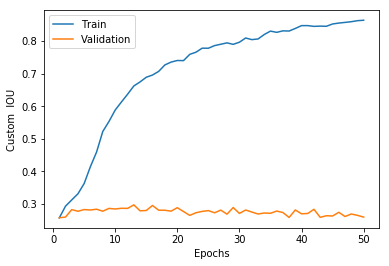

In [40]:
import matplotlib.pyplot as plt
%matplotlib inline

fig, ax = plt.subplots()

ax.plot(range(1, num_epochs + 1), history.history['custom_iou'], label='Train')
ax.plot(range(1, num_epochs + 1), history.history['val_custom_iou'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Custom  IOU')
leg = ax.legend();

plt.show()

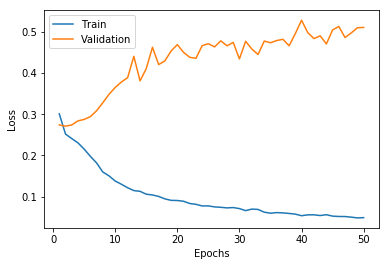

In [41]:
fig, ax = plt.subplots()

ax.plot(range(1, num_epochs + 1), history.history['loss'], label='Train')
ax.plot(range(1, num_epochs + 1), history.history['val_loss'], label='Validation')

plt.xlabel('Epochs')
plt.ylabel('Loss')
leg = ax.legend();

plt.show()

In [42]:
test_loss, test_iou, test_acc = model.evaluate(X_test, y_test, verbose=1)

510/510 [==============================] - 0s 110us/step


In [43]:
test_loss

0.5492320168252085

In [44]:
test_acc

0.8469834009806315

In [45]:
model.metrics_names

['loss', 'custom_iou', 'acc']

In [46]:
model.predict(X_test[45:46])

array([[2.16886494e-03, 2.59033646e-02, 1.19540165e-03, 1.47079176e-03,
        1.00202160e-03, 8.63136025e-04, 1.22421312e-07, 7.95386359e-03,
        5.64353068e-05, 2.06179870e-03, 1.10261105e-02, 3.36660934e-03,
        2.42075458e-01, 3.59733909e-01, 2.52484984e-08, 3.17691751e-02,
        1.00959269e-02, 3.24939494e-03, 1.08691610e-01, 6.38800934e-02,
        3.23122364e-08, 4.23386833e-03, 2.74125458e-04, 9.28739250e-01,
        8.06920510e-03, 2.16327548e-01]], dtype=float32)

In [47]:
y_test[45:46]

,tag_technology,tag_science,tag_design,tag_business,tag_collaboration,tag_innovation,tag_social_change,tag_health,tag_nature,tag_environment,tag_future,tag_communication,tag_activism,tag_children,tag_personal_growth,tag_humanity,tag_society,tag_identity,tag_community,tag_culture,tag_global_issues,tag_entertainment,tag_art,tag_politics,tag_economics,tag_religion
336,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,1,0,0,0,0,0,0,0


In [48]:
pred = model.predict(X_train)

thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
acc = []
accuracies = []
best_threshold = np.zeros(pred.shape[1])

for col_ix in range(pred.shape[1]):
    
    col_name = y_train.columns[col_ix]
    y_prob = np.array(pred[:,col_ix])
    
    for th in thresholds:
        y_pred_t = [1 if prob>=th else 0 for prob in y_prob]
        acc.append( matthews_corrcoef(y_train[col_name],y_pred_t))
        
    acc   = np.array(acc)
    index = np.where(acc==acc.max()) 
    accuracies.append(acc.max()) 
    best_threshold[col_ix] = thresholds[index[0][0]]
    acc = []
    
print(best_threshold)
print(accuracies)

[0.5 0.4 0.7 0.4 0.7 0.5 0.1 0.6 0.5 0.6 0.3 0.6 0.8 0.8 0.1 0.3 0.7 0.5
 0.6 0.6 0.1 0.8 0.6 0.7 0.5 0.5]
[0.7677822614321961, 0.773860695051702, 0.8293939632564622, 0.8115009841114242, 0.7302017304850188, 0.6738381674668178, 0.0, 0.6757413036524952, 0.7640559276365858, 0.7362498096030563, 0.5623447546320506, 0.6462306661372064, 0.4743616124792766, 0.542408254799337, 0.0, 0.684173995293723, 0.7701665549475194, 0.7039148370210165, 0.6576173206493663, 0.8134346238922467, 0.0, 0.8481288776134948, 0.830514881362854, 0.8136006344091179, 0.792110899218253, 0.8727853971304835]


In [49]:
y_pred = np.array([[1 if pred[i,j] >= best_threshold[j] else 0 for j in range(y_test.shape[1])] for i in range(len(y_test))])

In [50]:
#print(y_pred.shape)
print(y_pred)
#print(type(y_pred))
#print(y_test.shape)
#print(y_test)
#print(type(y_pred))

[[1 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [51]:
y_test.to_numpy().shape

(510, 26)

In [52]:
def multilabel_accuracy(y_true,y_pred):
    
    A = 0.0
    I, U = 0,0
    
    #print("y_true:{}".format(len(y_true)))
    for i in range(len(y_true)):
        print("True:{}".format(y_true[i]))
        print("Pred:{}".format(y_pred[i]))
        intersection = 0.0
        for j in range(len(y_true[i])):
            if y_true[i][j] == y_pred[i][j] == 1:
                intersection += 1
        union = y_true[i].sum() + y_pred[i].sum() - intersection
        
        if union != 0:
            A += intersection/union
        
        I += intersection
        U += union
        
        print("Intersection:{}".format(intersection))
        print("Union:{}".format(union))
        print("IOU:{:.2f}".format(intersection/union))
        print("Sum A:{}".format(A))
    
    
    print("I:{} - U:{} - IOU:{:.3f}".format(I,U,(I/U)*100))
    return (A/len(y_true))*100

In [53]:
custom_acc = multilabel_accuracy(y_test.to_numpy(),y_pred)

True:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
Intersection:0.0
Union:4.0
IOU:0.00
Sum A:0.0
True:[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
Intersection:1.0
Union:2.0
IOU:0.50
Sum A:0.5
True:[1 0 0 1 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Pred:[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:7.0
IOU:0.00
Sum A:0.5
True:[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
Pred:[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:3.0
IOU:0.00
Sum A:0.5
True:[0 1 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0]
Pred:[0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:1.0
Union:5.0
IOU:0.20
Sum A:0.7
True:[1 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 0 0]
Intersection:0.0
Union:6.0
IOU:0.00
Sum A:0.7
True:[1 0 0 1 0 

True:[1 0 0 0 1 0 0 0 0 0 1 1 0 1 0 1 1 1 1 0 0 0 0 0 0 1]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:1.0
Union:10.0
IOU:0.10
Sum A:10.346825396825398
True:[0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0]
Pred:[1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:6.0
IOU:0.00
Sum A:10.346825396825398
True:[0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:3.0
IOU:0.00
Sum A:10.346825396825398
True:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0]
Pred:[1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:4.0
IOU:0.00
Sum A:10.346825396825398
True:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[1 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:4.0
IOU:0.00
Sum A:10.346825396825398
True:[1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0

True:[1 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:5.0
IOU:0.00
Sum A:17.52420634920635
True:[1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0]
Pred:[0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:8.0
IOU:0.00
Sum A:17.52420634920635
True:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:2.0
IOU:0.00
Sum A:17.52420634920635
True:[0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0]
Pred:[1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:6.0
IOU:0.00
Sum A:17.52420634920635
True:[1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0]
Pred:[1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:1.0
Union:6.0
IOU:0.17
Sum A:17.690873015873017
True:[1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 1 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 

Union:3.0
IOU:0.00
Sum A:27.53968253968253
True:[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:3.0
IOU:0.00
Sum A:27.53968253968253
True:[1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:3.0
IOU:0.00
Sum A:27.53968253968253
True:[0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Intersection:1.0
Union:3.0
IOU:0.33
Sum A:27.873015873015863
True:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
Pred:[0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:5.0
IOU:0.00
Sum A:27.873015873015863
True:[0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:6.0
IOU:0.00
Sum A:27.873015873015863
True:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Pred:

IOU:0.00
Sum A:32.725793650793634
True:[0 1 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 1 0]
Pred:[0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0]
Intersection:0.0
Union:7.0
IOU:0.00
Sum A:32.725793650793634
True:[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:2.0
IOU:0.00
Sum A:32.725793650793634
True:[1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:2.0
IOU:0.00
Sum A:32.725793650793634
True:[1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0]
Intersection:0.0
Union:5.0
IOU:0.00
Sum A:32.725793650793634
True:[0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Intersection:0.0
Union:1.0
IOU:0.00
Sum A:32.725793650793634
True:[1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Pred:[0 0 1 

In [54]:
custom_acc

6.554077186430125

In [55]:
i=100
print(y_test.to_numpy()[i])
print(y_pred[i])

[1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
